<a href="https://colab.research.google.com/github/AjayKumarGogineni777/Image-Super-Resolution-using-GAN/blob/master/GAN_Pretrained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
os.listdir('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/train/')

['with clouds', 'without clouds', 'image_gen', 'models']

In [0]:
import os
#path = '/content/gdrive/My Drive/Satellite/clouds_final/train/'
path = '/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/train/'
path_hr = path+'without clouds/'
path_lr = path+'with clouds/'
print(len(os.listdir(path_hr)))
print(len(os.listdir(path_lr)))

7239
7239


In [0]:
a1 = os.listdir(path_hr)
a2 = os.listdir(path_lr)

In [0]:
k = np.where(a1 != a2)

In [0]:
k

(array([0]),)

In [0]:
a2

In [0]:
a1

In [0]:
comm = []
for i in range(7527):
  

In [0]:
at = a2[0:7239]

In [0]:
#from crappify import *
il = ImageList.from_folder(path_hr)
#parallel(crappifier(path_lr, path_hr), il.items)

In [0]:
il[0]

In [0]:
bs,size=32, 128
# bs,size = 24,160
#bs,size = 8,256
arch = models.resnet34

In [0]:
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [0]:

#func = lambda x: path_hr+'/'+str(x.name)
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr+x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data
data_gen = get_data(bs,size)  

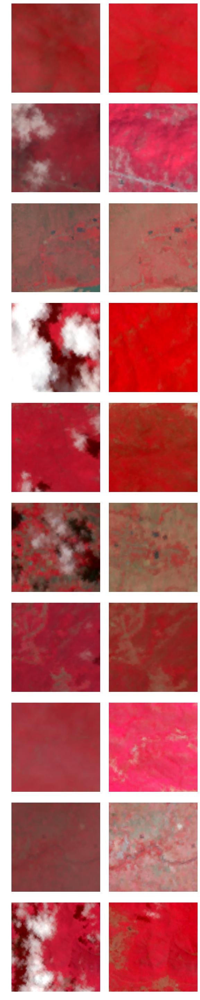

In [0]:
data_gen.show_batch(10)

In [0]:
wd = 1e-3

In [0]:
y_range = (-3.,3.)

In [0]:
loss_gen = MSELossFlat()

In [0]:
def create_gen_learner():
    return unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Weight,
                         self_attention=True, y_range=y_range, loss_func=loss_gen)

In [0]:
learn_gen = create_gen_learner()

In [0]:
learn_gen.fit_one_cycle(2, pct_start=0.8)

epoch,train_loss,valid_loss,time
0,0.296866,0.255895,48:11
1,0.247543,0.194855,02:43


In [0]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


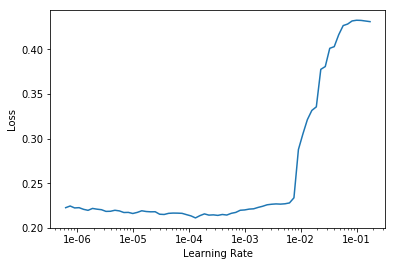

In [0]:
learn_gen.lr_find(end_lr=10)
learn_gen.recorder.plot()

In [0]:
learn_gen.save(path + 'models/gen-pre-ver-0')

In [0]:
## max_lr=slice(1e-4,1e-3)

In [0]:
learn_gen.fit_one_cycle(3, slice(1e-6,8e-4))

epoch,train_loss,valid_loss,time
0,0.215065,0.203097,02:49
1,0.177083,0.142362,02:48
2,0.152108,0.132603,02:49


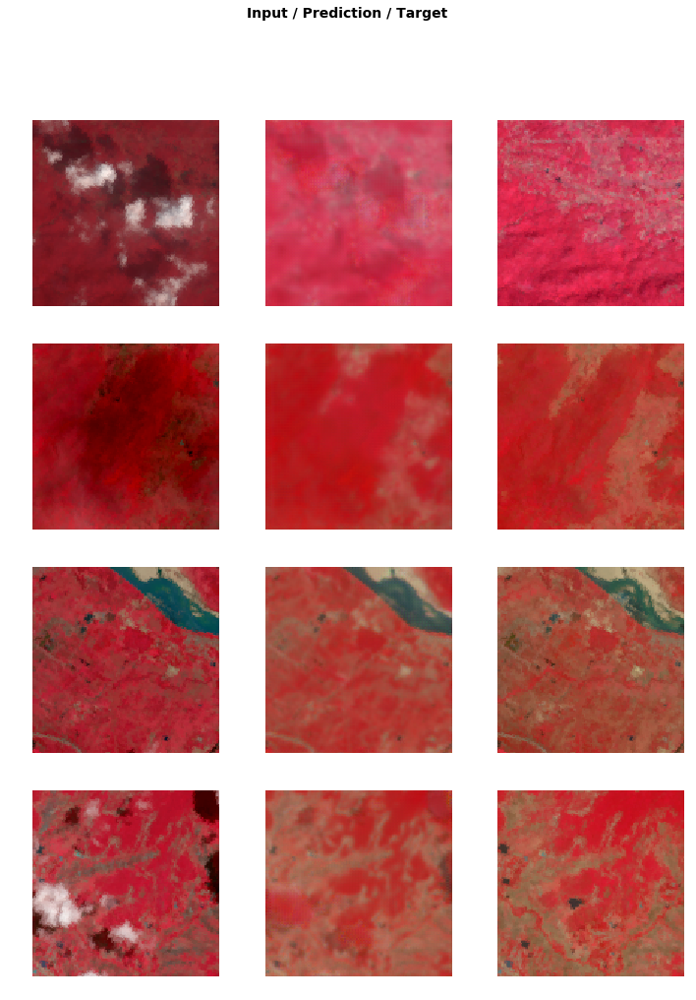

In [0]:
learn_gen.show_results(rows=4)

In [0]:
learn_gen.save('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gen-pre2')

In [0]:
learn_gen.load('/content/gdrive/My Drive/Satellite/GAN/models/gen-pre2');

In [0]:
name_gen = 'image_gen'
path_gen = path+name_gen

In [0]:
path_gen

'/content/gdrive/My Drive/Satellite/GAN/image_gen'

In [0]:
#### Comment after first call


#shutil.rmtree(path_gen)

In [0]:
os.mkdir(path_gen)

In [0]:
def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_gen+'/'+names[i].name)
            i += 1

In [0]:
save_preds(data_gen.fix_dl)

In [0]:
PIL.Image.open(path_gen.ls()[0])

AttributeError: ignored

In [0]:
learn_gen=None
gc.collect()

29501

In [0]:
def get_crit_data(classes, bs, size):
    src = ImageList.from_folder(path, include=classes).split_by_rand_pct(0.1, seed=42)
    ll = src.label_from_folder(classes=classes)
    data = (ll.transform(get_transforms(max_zoom=2.), size=size)
           .databunch(bs=bs).normalize(imagenet_stats))
    data.c = 3
    return data

In [0]:
#modified_data_critic = get_crit_data([name_gen, 'images_all', 'gen_op'], bs=bs, size=size)

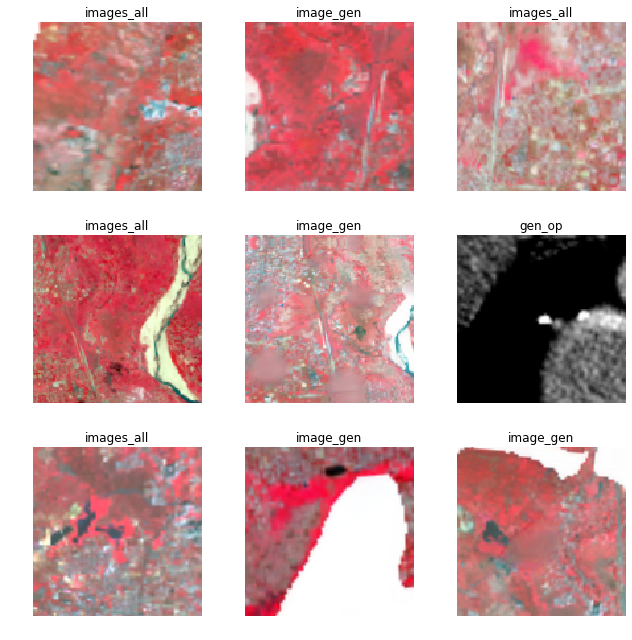

In [0]:
#modified_data_critic.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)

In [0]:
data_crit = get_crit_data([name_gen, 'without clouds'], bs=bs, size=size)

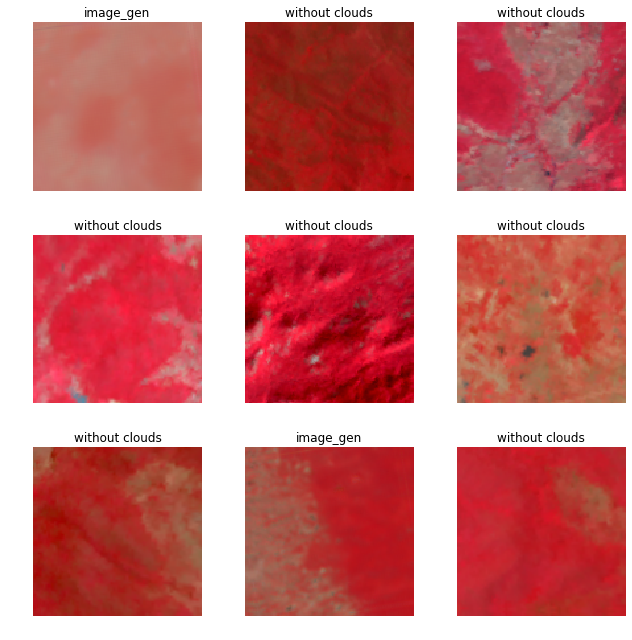

In [0]:
data_crit.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)

In [0]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

In [0]:
def create_critic_learner(data, metrics):
    return Learner(data, gan_critic(), metrics=metrics, loss_func=loss_critic, wd=wd)

In [0]:
## modified critic
#learn_critic = create_critic_learner(modified_data_critic, accuracy_thresh_expand)

In [0]:
## Normal
learn_critic = create_critic_learner(data_crit, accuracy_thresh_expand)

In [0]:
learn_critic.fit_one_cycle(5, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.687229,0.686080,0.540625,06:45
1,0.646457,0.620880,0.675025,06:32
2,0.461962,0.493243,0.721542,06:33
3,0.403533,0.372079,0.817134,06:33
4,0.355593,0.354397,0.814982,06:33


In [0]:
learn_critic.save('/content/gdrive/My Drive/Satellite/GAN/models/critic-pre2')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


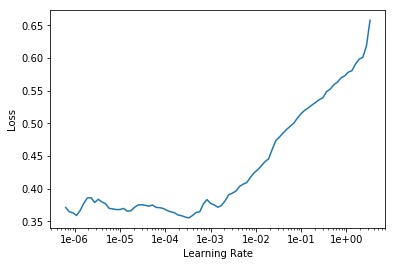

In [0]:
learn_critic.lr_find(end_lr=10)
learn_critic.recorder.plot()

In [0]:
learn_critic.fit_one_cycle(4, 2e-4)

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.362339,0.387121,0.786938,06:32
1,0.335033,0.374447,0.803374,06:32
2,0.307629,0.237239,0.906269,06:33
3,0.301532,0.269455,0.868043,06:36


In [0]:
learn_critic.save('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/critic-pre2_lr_1e_4')


In [0]:
##### Combining pre trained models

In [0]:
learn_crit=None
learn_gen=None
gc.collect()

90

In [0]:
## crappy = clouds_all  images = images_all
#data_crit = get_crit_data(['clouds_all', 'images_all'], bs=bs, size=size)

data_crit = get_crit_data([name_gen, 'without clouds'], bs=bs, size=size)

In [0]:
#learn_crit = create_critic_learner(data_crit, metrics=None).load('/content/gdrive/My Drive/Satellite/GAN/models/critic-pre2')
learn_crit = create_critic_learner(data_crit, metrics=None).load('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/critic-pre2_lr_1e_4')


In [0]:
learn_gen = create_gen_learner().load('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gen-pre2')

In [0]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,50.), show_img=False, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))

In [0]:
lr = 1e-4

In [0]:
learn.fit(40,lr)

In [0]:
learn.save('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gan-1c')

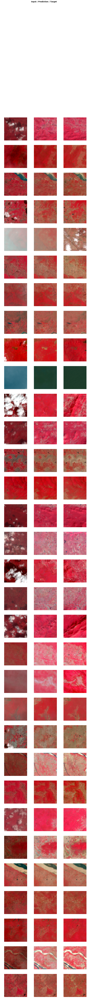

In [0]:
learn.show_results(rows=40)

In [0]:
#learn.freeze()

In [0]:
learn.load('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gan-1c')

GANLearner(data=ImageDataBunch;

Train: LabelList (6516 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/train/with clouds;

Valid: LabelList (723 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/train/with clouds;

Test: None, model=GANModule(
  (generator): DynamicUnet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [0]:
learn.fit(20,lr/2)

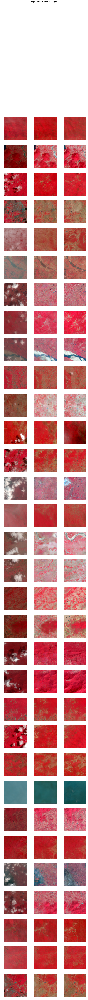

In [0]:
learn.show_results(rows=40)

In [0]:
learn.save('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gan-2c-mod')

In [0]:

#learn.load('/content/gdrive/My Drive/Satellite/zip folder/fin/clouds_final/models/gan-2c')


In [0]:
#learn.show_results(rows=20)